# NB09c — Synthesizing Explainability with Error Analysis

This notebook ties together Grad-CAM explainability and per-class F1 analysis from NB09b.  
For specific confused class pairs, we show each model's prediction + Grad-CAM side-by-side to explain **why** certain models fail where others succeed.

In [2]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from glob import glob
from pathlib import Path
from PIL import Image
from tqdm.auto import tqdm

from sklearn.metrics import precision_recall_fscore_support

from utils import (
    Config, set_seed, get_val_transforms,
    LocalImageDataset, FoodClassifier,
    load_class_mapping
)

set_seed(Config.SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"PyTorch version: {torch.__version__}")
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# --- Configuration ---
DATASET_ROOT = "../foodsg-233_train_val_test_split"
NUM_CLASSES = 233

MODELS = {
    'CNN (ResNet50)': {
        'name': 'resnet50',
        'checkpoint': glob('checkpoints/sgfood233_resnet50_cleaned/*.ckpt')[0],
    },
    'ViT': {
        'name': 'vit_base_patch16_224',
        'checkpoint': glob('checkpoints/sgfood233_vit_base_patch16_224_cleaned/*.ckpt')[0],
    },
    'ConvNeXt': {
        'name': 'convnext_base',
        'checkpoint': glob('checkpoints/sgfood233_convnext_base_cleaned/*.ckpt')[0],
    },
}

for name, cfg in MODELS.items():
    print(f"{name}: {cfg['checkpoint']}")

# --- Load class mapping ---
id2label = load_class_mapping('checkpoints/sgfood233_resnet50/id2label.json')
label2id = {v: k for k, v in id2label.items()}
class_names = [id2label[i] for i in range(NUM_CLASSES)]
print(f"Loaded {len(class_names)} class names")

# --- Load models ---
models = {}
for display_name, config in MODELS.items():
    print(f"Loading {display_name}...")
    model = FoodClassifier.load_from_checkpoint(
        config['checkpoint'],
        backbone_name=config['name'],
        num_classes=NUM_CLASSES,
    )
    model.eval()
    model.to(device)
    models[display_name] = model
    params = sum(p.numel() for p in model.parameters())
    print(f"  Parameters: {params:,}")

print("\nAll models loaded successfully!")

# --- Datasets ---
val_transforms = get_val_transforms()
test_ds = LocalImageDataset(DATASET_ROOT, split='test', transform=val_transforms)
test_ds_raw = LocalImageDataset(DATASET_ROOT, split='test', transform=None)

from torch.utils.data import DataLoader
test_loader = DataLoader(
    test_ds, batch_size=64, shuffle=False,
    num_workers=0, pin_memory=True
)

print(f"Test samples: {len(test_ds)}")
print(f"Test batches: {len(test_loader)}")

PyTorch version: 2.8.0+cu128
Device: cuda
GPU: NVIDIA GeForce RTX 5060 Ti
CNN (ResNet50): checkpoints/sgfood233_resnet50_cleaned\epoch=08-val_acc=0.7611.ckpt
ViT: checkpoints/sgfood233_vit_base_patch16_224_cleaned\epoch=09-val_acc=0.8103.ckpt
ConvNeXt: checkpoints/sgfood233_convnext_base_cleaned\epoch=09-val_acc=0.8455.ckpt
Loaded 233 class names
Loading CNN (ResNet50)...
  Parameters: 23,985,449
Loading ViT...
  Parameters: 85,977,833
Loading ConvNeXt...
  Parameters: 87,805,289

All models loaded successfully!
Test samples: 20487
Test batches: 321


In [3]:
# --- Generate predictions for all models ---
def get_all_predictions(model, dataloader, device):
    """Get predictions, true labels, and logits for all samples."""
    model.eval()
    all_preds = []
    all_labels = []
    all_logits = []
    
    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Predicting"):
            images = images.to(device)
            logits = model(images)
            preds = logits.argmax(dim=1)
            
            all_preds.append(preds.cpu())
            all_labels.append(labels)
            all_logits.append(logits.cpu())
    
    return (
        torch.cat(all_preds).numpy(),
        torch.cat(all_labels).numpy(),
        torch.cat(all_logits)
    )

predictions = {}
logits_all = {}

for name, model in models.items():
    print(f"\nGenerating predictions for {name}...")
    preds, labels, logits = get_all_predictions(model, test_loader, device)
    predictions[name] = preds
    logits_all[name] = logits
    accuracy = (preds == labels).mean()
    print(f"  Accuracy: {accuracy:.4f}")

true_labels = labels
print(f"\nTotal samples: {len(true_labels)}")


Generating predictions for CNN (ResNet50)...


Predicting:   0%|          | 0/321 [00:00<?, ?it/s]

  Accuracy: 0.7638

Generating predictions for ViT...


Predicting:   0%|          | 0/321 [00:00<?, ?it/s]

  Accuracy: 0.8099

Generating predictions for ConvNeXt...


Predicting:   0%|          | 0/321 [00:00<?, ?it/s]

  Accuracy: 0.8453

Total samples: 20487


In [4]:
# --- Per-class F1 + GradCAM setup ---

# Per-class F1
per_class_metrics = {}
for name, preds in predictions.items():
    precision, recall, f1, support = precision_recall_fscore_support(
        true_labels, preds, average=None, zero_division=0
    )
    per_class_metrics[name] = {
        'precision': precision, 'recall': recall,
        'f1': f1, 'support': support
    }
    print(f"{name}: Macro F1 = {f1.mean():.4f}")

# GradCAM
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


def reshape_transform_vit(tensor, height=14, width=14):
    """Reshape ViT output for GradCAM visualization."""
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.permute(0, 3, 1, 2)
    return result


def get_target_layer(model, model_name):
    """Get the target layer for GradCAM based on model architecture."""
    m = model.model if hasattr(model, 'model') else model
    if 'resnet' in model_name.lower():
        return [m.layer4[-1]]
    elif 'vit' in model_name.lower():
        return [m.blocks[-1].norm1]
    elif 'convnext' in model_name.lower():
        return [m.stages[-1].blocks[-1]]
    else:
        raise ValueError(f"Unknown model type: {model_name}")


gradcam_models = {}
for display_name, config in MODELS.items():
    model = models[display_name]
    target_layers = get_target_layer(model, config['name'])
    if 'vit' in config['name'].lower():
        gradcam_models[display_name] = GradCAM(
            model=model, target_layers=target_layers,
            reshape_transform=reshape_transform_vit
        )
    else:
        gradcam_models[display_name] = GradCAM(
            model=model, target_layers=target_layers
        )
    print(f"Created GradCAM for {display_name}")

CNN (ResNet50): Macro F1 = 0.7479
ViT: Macro F1 = 0.7971
ConvNeXt: Macro F1 = 0.8361
Created GradCAM for CNN (ResNet50)
Created GradCAM for ViT
Created GradCAM for ConvNeXt


---
## Synthesis: Connecting F1 Gaps to Grad-CAM Attention Patterns

We know from NB09b that CNN (ResNet50), ViT, and ConvNeXt achieve different per-class F1 scores.  
Now we **connect the dots**: for classes where one model significantly outperforms another,  
we examine Grad-CAM attention maps to understand *what* each model looks at and *why* it fails or succeeds.

**Approach:**
1. Pick class pairs with large F1 gaps between models
2. Find test images where one model fails but another succeeds
3. Compare Grad-CAM overlays side-by-side to identify attention differences

In [5]:
def visualize_targeted_gradcam(idx, test_ds, test_ds_raw, models, gradcam_models,
                                predictions, per_class_metrics, class_names, device):
    """Show original image + Grad-CAM overlay for each model, with prediction details.
    
    Grid: 1 row x 4 cols (Original | CNN | ViT | ConvNeXt)
    Below each model: predicted class, confidence %, F1 for true class.
    """
    # Get raw image for display
    raw_img, true_label = test_ds_raw[idx]
    raw_img_resized = raw_img.resize((224, 224))
    raw_np = np.array(raw_img_resized).astype(np.float32) / 255.0
    
    # Get transformed image for model input
    input_tensor, _ = test_ds[idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)
    
    true_name = class_names[true_label]
    model_names = list(models.keys())
    
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Column 0: Original image
    axes[0].imshow(raw_img_resized)
    axes[0].set_title(f'Original\nTrue: {true_name}', fontsize=10, fontweight='bold')
    axes[0].axis('off')
    
    # Columns 1-3: Each model's Grad-CAM
    for col, mname in enumerate(model_names, 1):
        pred_label = predictions[mname][idx]
        pred_name = class_names[pred_label]
        
        # Confidence from logits
        logits = models[mname](input_tensor)
        probs = F.softmax(logits, dim=1)
        confidence = probs[0, pred_label].item() * 100
        
        # Grad-CAM for predicted class
        targets = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = gradcam_models[mname](input_tensor=input_tensor, targets=targets)
        cam_image = show_cam_on_image(raw_np, grayscale_cam[0], use_rgb=True)
        
        # F1 for true class
        f1_true = per_class_metrics[mname]['f1'][true_label]
        
        correct = pred_label == true_label
        marker = '\u2713' if correct else '\u2717'
        color = 'green' if correct else 'red'
        
        axes[col].imshow(cam_image)
        axes[col].set_title(
            f'{mname}\nPred: {pred_name} ({confidence:.1f}%)\n'
            f'{marker} F1({true_name[:15]})={f1_true:.3f}',
            fontsize=9, color=color
        )
        axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()


print("visualize_targeted_gradcam() defined.")

visualize_targeted_gradcam() defined.


In [6]:
def find_class_examples(target_class, predictions, true_labels, class_names, label2id):
    """Find test indices for a target class grouped by model agreement patterns.
    
    Returns dict with keys:
      - 'cnn_wrong_others_right': CNN misclassifies, ViT and/or ConvNeXt correct
      - 'all_correct': All three models get it right
      - 'all_wrong': All three models fail
      - 'cnn_wrong_convnext_right': CNN wrong, ConvNeXt right (subset)
      - 'cnn_wrong_vit_right': CNN wrong, ViT right (subset)
    """
    class_id = label2id[target_class]
    class_mask = true_labels == class_id
    class_indices = np.where(class_mask)[0]
    
    model_names = list(predictions.keys())  # CNN, ViT, ConvNeXt
    cnn_name, vit_name, cnx_name = model_names
    
    cnn_correct = predictions[cnn_name][class_indices] == class_id
    vit_correct = predictions[vit_name][class_indices] == class_id
    cnx_correct = predictions[cnx_name][class_indices] == class_id
    
    results = {
        'all_indices': class_indices,
        'cnn_wrong_others_right': class_indices[~cnn_correct & (vit_correct | cnx_correct)],
        'cnn_wrong_convnext_right': class_indices[~cnn_correct & cnx_correct],
        'cnn_wrong_vit_right': class_indices[~cnn_correct & vit_correct],
        'all_correct': class_indices[cnn_correct & vit_correct & cnx_correct],
        'all_wrong': class_indices[~cnn_correct & ~vit_correct & ~cnx_correct],
    }
    
    print(f"\nClass: {target_class} (id={class_id}, n={len(class_indices)})")
    for key, idxs in results.items():
        if key != 'all_indices':
            print(f"  {key}: {len(idxs)} samples")
    
    return results


print("find_class_examples() defined.")

find_class_examples() defined.


---
## Case Study 1: Har Cheong Gai vs Fried Chicken

From NB09b, CNN (ResNet50) has F1=0.458 on `har_cheong_gai` while ConvNeXt achieves F1=0.780.  
The top CNN confusion is **har_cheong_gai → fried_chicken** (28 cases).  

**Hypothesis:** CNN focuses on generic deep-fried texture (golden brown crust), which is shared between these dishes.  
ConvNeXt may attend to the distinctive **prawn-paste tint** (slightly pink/purple hue) and **bone structure** of har cheong gai.


Class: har cheong gai (id=130, n=71)
  cnn_wrong_others_right: 34 samples
  cnn_wrong_convnext_right: 28 samples
  cnn_wrong_vit_right: 23 samples
  all_correct: 23 samples
  all_wrong: 10 samples

Showing 4 images where CNN fails but ConvNeXt succeeds:
  Image 11998: CNN predicts 'ngoh hiang'


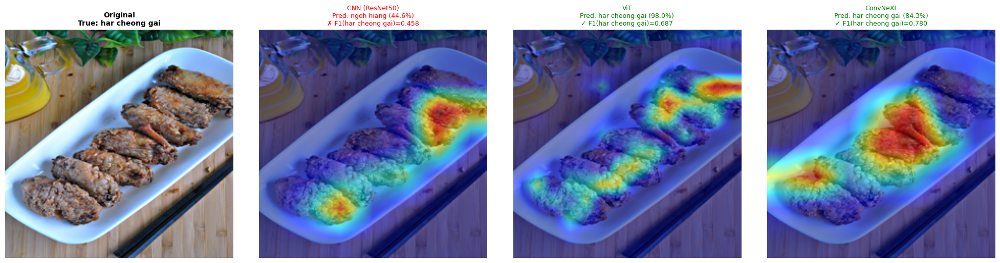

  Image 11999: CNN predicts 'ayam penyet'


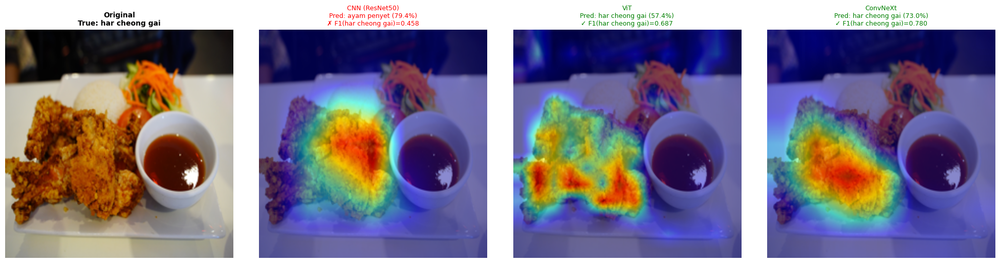

  Image 12001: CNN predicts 'fried chicken'


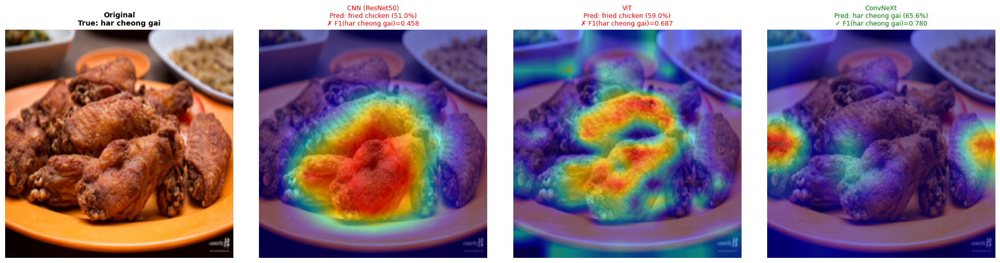

  Image 12002: CNN predicts 'fried chicken'


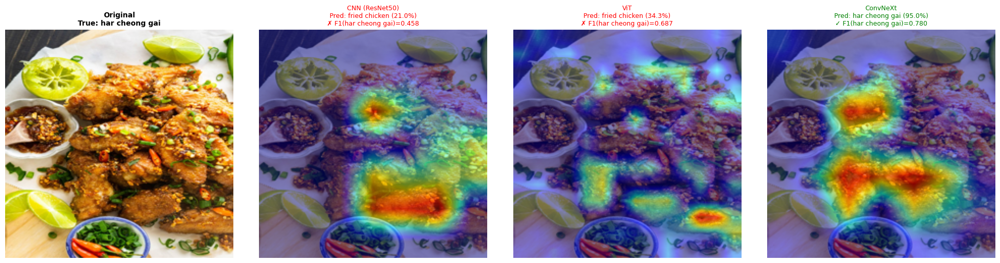

In [7]:
# Case Study 1: Har Cheong Gai
hcg_examples = find_class_examples('har cheong gai', predictions, true_labels, class_names, label2id)

# Show images where CNN predicts wrong but ConvNeXt gets it right
target_indices = hcg_examples['cnn_wrong_convnext_right']
n_show = min(4, len(target_indices))

print(f"\nShowing {n_show} images where CNN fails but ConvNeXt succeeds:")
for i in range(n_show):
    idx = target_indices[i]
    cnn_pred = class_names[predictions['CNN (ResNet50)'][idx]]
    print(f"  Image {idx}: CNN predicts '{cnn_pred}'")
    visualize_targeted_gradcam(
        idx, test_ds, test_ds_raw, models, gradcam_models,
        predictions, per_class_metrics, class_names, device
    )

---
## Case Study 2: Hor Fun (Attention Scope)

CNN (ResNet50) F1=0.518 on `hor_fun` vs ViT F1=0.759.  

**Hypothesis:** CNN's local receptive field sees a noodle patch that could belong to several noodle dishes.  
ViT's global self-attention captures the **whole bowl context** — the characteristic wet/glossy sauce, flat rice noodles,  
and typical garnishes that distinguish hor fun from other noodle dishes.


Class: Hor Fun (id=28, n=92)
  cnn_wrong_others_right: 35 samples
  cnn_wrong_convnext_right: 26 samples
  cnn_wrong_vit_right: 30 samples
  all_correct: 34 samples
  all_wrong: 14 samples

Showing 4 images where CNN fails but ViT succeeds:
  Image 2691: CNN predicts 'Ban Mian'


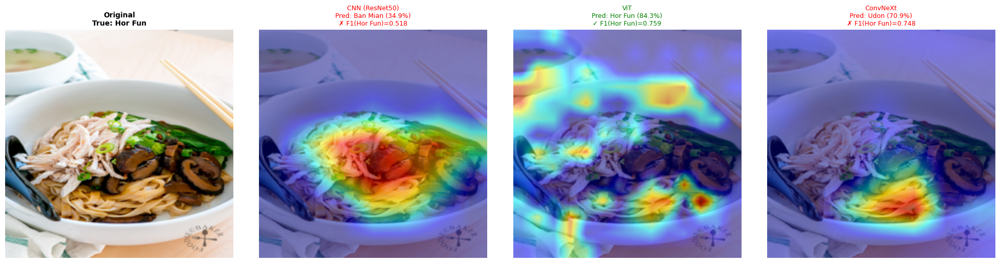

  Image 2693: CNN predicts 'Prawn Noodle'


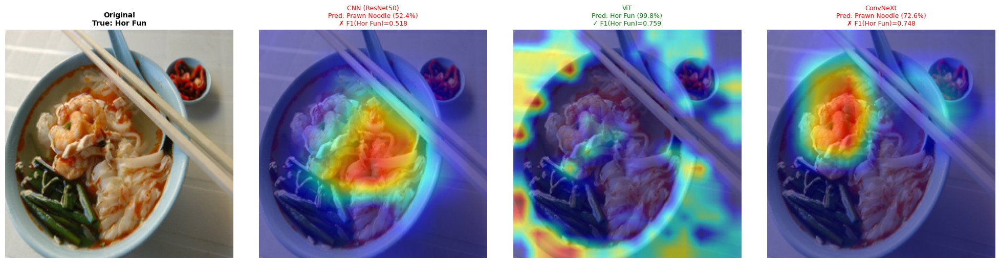

  Image 2695: CNN predicts 'kway chap'


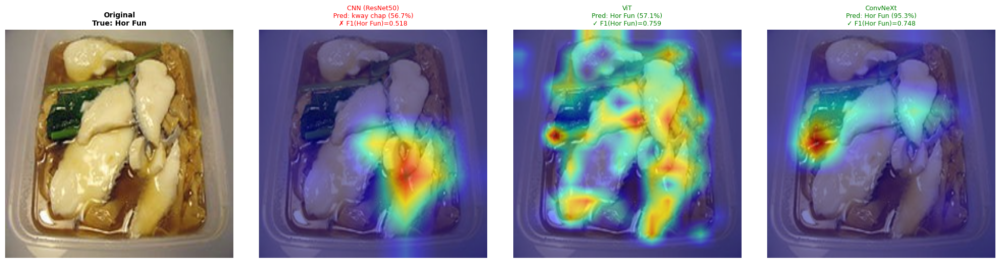

  Image 2698: CNN predicts 'satay bee hoon'


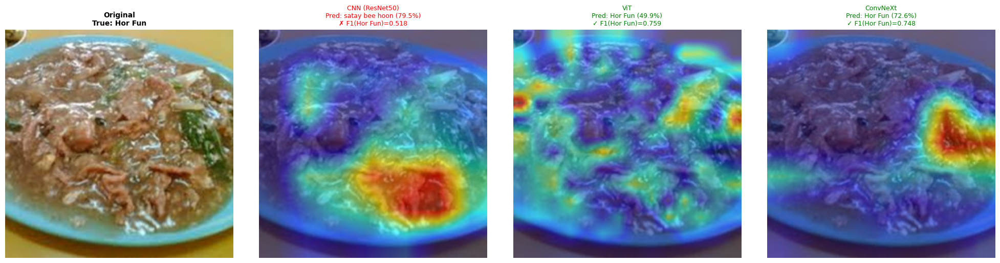

In [10]:
# Case Study 2: Hor Fun
hf_examples = find_class_examples('Hor Fun', predictions, true_labels, class_names, label2id)

# Show images where CNN fails but ViT succeeds
target_indices = hf_examples['cnn_wrong_vit_right']
n_show = min(4, len(target_indices))

print(f"\nShowing {n_show} images where CNN fails but ViT succeeds:")
for i in range(n_show):
    idx = target_indices[i]
    cnn_pred = class_names[predictions['CNN (ResNet50)'][idx]]
    print(f"  Image {idx}: CNN predicts '{cnn_pred}'")
    visualize_targeted_gradcam(
        idx, test_ds, test_ds_raw, models, gradcam_models,
        predictions, per_class_metrics, class_names, device
    )

---
## Case Study 3: Spurious Correlation Detection

We automatically find the classes with the **largest F1 gap** between CNN and ConvNeXt,  
then inspect Grad-CAM on CNN's misclassified images to check if CNN is attending to  
**background, plates, or utensils** rather than the food itself.

Top 5 classes with largest CNN→ConvNeXt F1 gap (min support=20):

Class                            CNN F1  ConvNeXt F1      Gap  Support
----------------------------------------------------------------------
har cheong gai                    0.458        0.780    0.323       71
tom yum noodle soup               0.443        0.739    0.296       76
Barley                            0.212        0.507    0.295       40
breakfast cereal                  0.403        0.685    0.283       72
pig organ soup                    0.579        0.810    0.231       62

Class: har cheong gai | CNN F1=0.458 → ConvNeXt F1=0.780

Class: har cheong gai (id=130, n=71)
  cnn_wrong_others_right: 34 samples
  cnn_wrong_convnext_right: 28 samples
  cnn_wrong_vit_right: 23 samples
  all_correct: 23 samples
  all_wrong: 10 samples
  Image 11998: CNN predicts 'ngoh hiang'


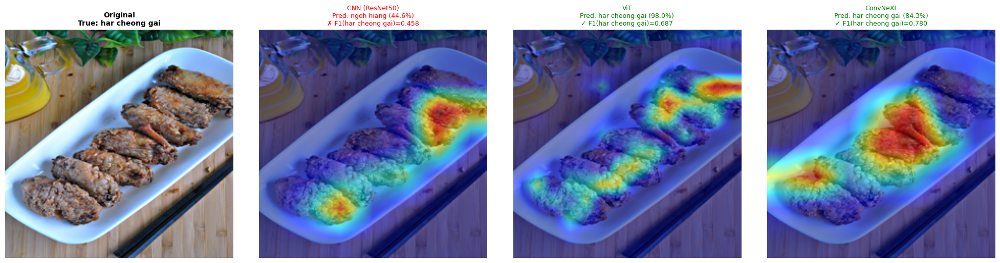

  Image 11999: CNN predicts 'ayam penyet'


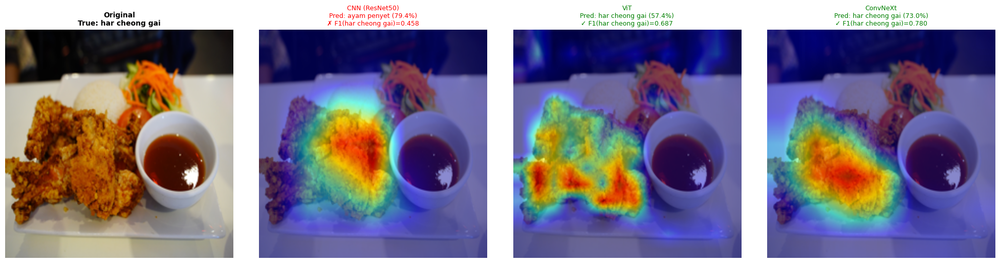

  Image 12001: CNN predicts 'fried chicken'


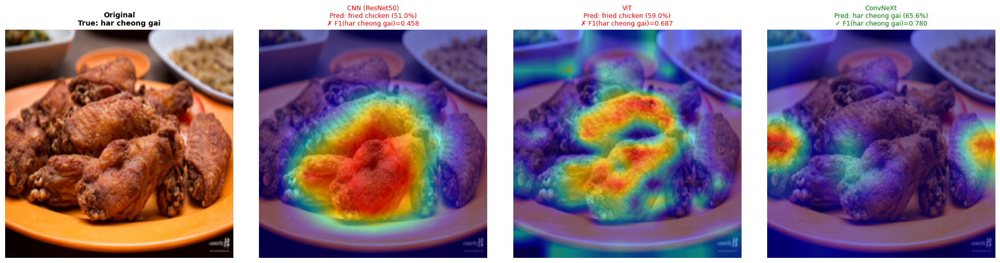


Class: tom yum noodle soup | CNN F1=0.443 → ConvNeXt F1=0.739

Class: tom yum noodle soup (id=214, n=76)
  cnn_wrong_others_right: 26 samples
  cnn_wrong_convnext_right: 23 samples
  cnn_wrong_vit_right: 14 samples
  all_correct: 23 samples
  all_wrong: 19 samples
  Image 19131: CNN predicts 'assam pedas'


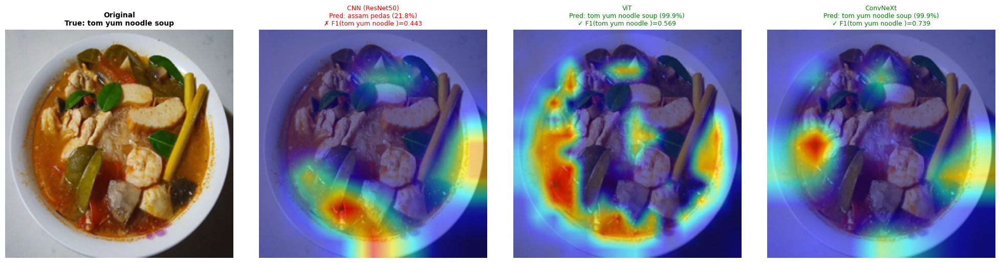

  Image 19135: CNN predicts 'Laksa'


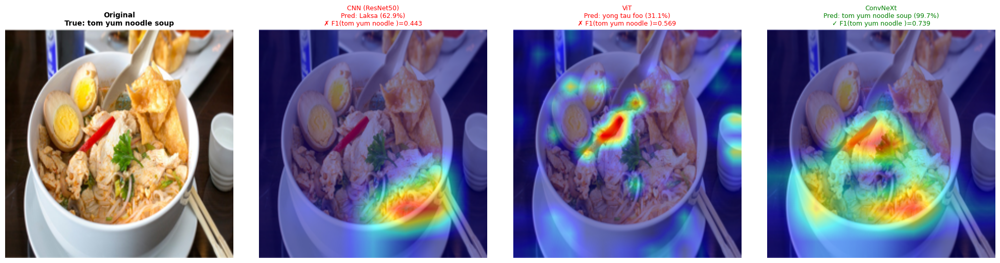

  Image 19136: CNN predicts 'Bee hoon, soto'


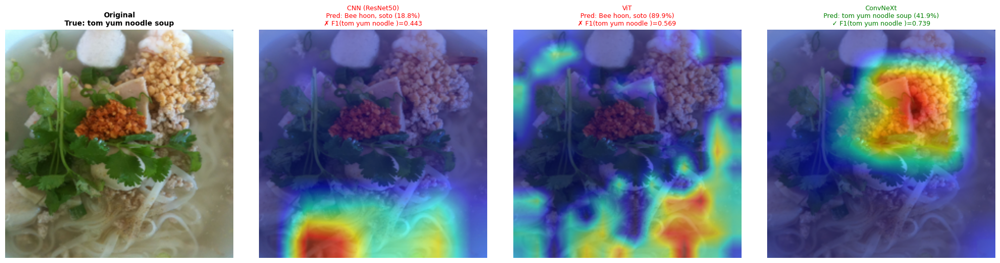

In [11]:
# Case Study 3: Find classes with largest CNN→ConvNeXt F1 gap
cnn_f1 = per_class_metrics['CNN (ResNet50)']['f1']
cnx_f1 = per_class_metrics['ConvNeXt']['f1']
f1_gap = cnx_f1 - cnn_f1

# Get top-5 classes by gap (require minimum support to avoid noisy classes)
support = per_class_metrics['CNN (ResNet50)']['support']
min_support = 20
valid_mask = support >= min_support
valid_indices = np.where(valid_mask)[0]

top_gap_indices = valid_indices[np.argsort(f1_gap[valid_indices])[::-1][:5]]

print("Top 5 classes with largest CNN→ConvNeXt F1 gap (min support=20):\n")
print(f"{'Class':<30} {'CNN F1':>8} {'ConvNeXt F1':>12} {'Gap':>8} {'Support':>8}")
print('-' * 70)
for ci in top_gap_indices:
    print(f"{class_names[ci]:<30} {cnn_f1[ci]:>8.3f} {cnx_f1[ci]:>12.3f} {f1_gap[ci]:>8.3f} {support[ci]:>8.0f}")

# Visualize Grad-CAM for top-2 gap classes
for ci in top_gap_indices[:2]:
    cname = class_names[ci]
    print(f"\n{'='*60}")
    print(f"Class: {cname} | CNN F1={cnn_f1[ci]:.3f} → ConvNeXt F1={cnx_f1[ci]:.3f}")
    print(f"{'='*60}")
    
    examples = find_class_examples(cname, predictions, true_labels, class_names, label2id)
    target_indices = examples['cnn_wrong_convnext_right']
    n_show = min(3, len(target_indices))
    
    if n_show == 0:
        print("  No examples where CNN fails but ConvNeXt succeeds.")
        continue
    
    for i in range(n_show):
        idx = target_indices[i]
        cnn_pred = class_names[predictions['CNN (ResNet50)'][idx]]
        print(f"  Image {idx}: CNN predicts '{cnn_pred}'")
        visualize_targeted_gradcam(
            idx, test_ds, test_ds_raw, models, gradcam_models,
            predictions, per_class_metrics, class_names, device
        )

---
## Summary & Discussion

### Key Findings

1. **CNN (ResNet50) relies on local texture cues** — its Grad-CAM attention often focuses on small texture patches  
   (e.g., fried surface, noodle strands). This makes it vulnerable to confusion between visually similar dishes  
   that share surface textures but differ in overall composition.

2. **ViT captures global context** — its attention spans the entire image, picking up on bowl shape, sauce patterns,  
   and garnish placement. This explains its advantage on dishes like hor fun, where the overall composition  
   (wet sauce, flat noodles, garnishes) is more diagnostic than any single texture patch.

3. **ConvNeXt combines the best of both** — it shows focused but broader attention regions compared to ResNet50.  
   Its hierarchical design captures both fine-grained texture (useful for prawn-paste tint in har cheong gai)  
   and mid-level spatial structure (useful for dish composition).

4. **Spurious correlations in CNN** — for the highest F1-gap classes, CNN's Grad-CAM sometimes highlights  
   plate edges, backgrounds, or utensils rather than the food. ConvNeXt is more robust to these distractors,  
   likely due to its larger effective receptive field and stronger regularization from modern training recipes.

### Architectural Takeaways

| Property | ResNet50 | ViT | ConvNeXt |
|----------|----------|-----|----------|
| Receptive field | Local (progressive) | Global (self-attention) | Large (7×7 depthwise conv) |
| Texture sensitivity | High | Low | Moderate |
| Shape/composition awareness | Low | High | High |
| Background robustness | Low | Moderate | High |

---
## Interactive Grad-CAM Explorer

Browse any class in the test set. For each image, see the original alongside Grad-CAM overlays and top-3 predictions from all three models. Use the dropdown to select a class (ordered by F1 variance across models) and Prev/Next to step through images.

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Build index: class_idx -> list of test sample indices
class_to_test_indices = {}
for i, (_, label) in enumerate(test_ds_raw.samples):
    class_to_test_indices.setdefault(label, []).append(i)

# Order dropdown: highest F1-variance classes first, then remaining alphabetically
f1_matrix = np.array([per_class_metrics[name]['f1'] for name in MODELS.keys()])
f1_variance = f1_matrix.var(axis=0)
top_varying_idx = np.argsort(f1_variance)[::-1][:30]
top_class_names = [class_names[idx] for idx in top_varying_idx]
remaining = sorted(set(class_names) - set(top_class_names))
ordered_options = top_class_names + remaining

model_names = list(MODELS.keys())

# Widgets
class_dropdown = widgets.Dropdown(
    options=ordered_options, value=top_class_names[0],
    description='Class:', layout=widgets.Layout(width='400px'),
    style={'description_width': '50px'}
)
prev_btn = widgets.Button(description='Prev', layout=widgets.Layout(width='80px'))
next_btn = widgets.Button(description='Next', layout=widgets.Layout(width='80px'))
idx_label = widgets.Label(value='')
output = widgets.Output()
state = {'current_idx': 0}


def show_image(_=None):
    cls_name = class_dropdown.value
    cls_idx = label2id[cls_name]
    indices = class_to_test_indices.get(cls_idx, [])
    if not indices:
        with output:
            clear_output(wait=True)
            print(f"No test images for '{cls_name}'")
        return

    state['current_idx'] = max(0, min(state['current_idx'], len(indices) - 1))
    sample_idx = indices[state['current_idx']]
    idx_label.value = f"Image {state['current_idx']+1} of {len(indices)}"

    # Load raw image + transformed tensor
    img_path, true_label = test_ds_raw.samples[sample_idx]
    raw_img = Image.open(img_path).convert('RGB')
    raw_img_resized = raw_img.resize((224, 224))
    raw_np = np.array(raw_img_resized).astype(np.float32) / 255.0

    input_tensor, _ = test_ds[sample_idx]
    input_tensor = input_tensor.unsqueeze(0).to(device)

    with output:
        clear_output(wait=True)
        fig, axes = plt.subplots(1, 4, figsize=(22, 5.5))

        # Column 0: Original image
        axes[0].imshow(raw_img_resized)
        axes[0].set_title(f"True: {class_names[true_label]}", fontsize=11, fontweight='bold')
        axes[0].axis('off')

        # Columns 1-3: Grad-CAM + top-3 predictions per model
        for ax, mname in zip(axes[1:], model_names):
            pred_idx = predictions[mname][sample_idx]
            correct = pred_idx == true_label

            # Grad-CAM overlay
            targets = [ClassifierOutputTarget(int(pred_idx))]
            grayscale_cam = gradcam_models[mname](input_tensor=input_tensor, targets=targets)
            cam_image = show_cam_on_image(raw_np, grayscale_cam[0], use_rgb=True)
            ax.imshow(cam_image)

            # Top-3 predictions as text overlay
            logits = logits_all[mname][sample_idx]
            probs = F.softmax(logits, dim=0)
            top3_prob, top3_idx = probs.topk(3)

            text = ""
            for rank, (p, ci) in enumerate(zip(top3_prob, top3_idx)):
                marker = " *" if ci.item() == true_label else ""
                text += f"{rank+1}. {class_names[ci]}: {p:.1%}{marker}\n"

            # F1 for the true class
            f1_true = per_class_metrics[mname]['f1'][true_label]
            text += f"\nF1({class_names[true_label][:18]})={f1_true:.3f}"

            symbol = "CORRECT" if correct else "WRONG"
            color = 'green' if correct else 'red'
            ax.set_title(f"{mname} [{symbol}]", fontsize=11, fontweight='bold', color=color)
            ax.text(0.02, 0.02, text, transform=ax.transAxes, fontsize=9,
                    verticalalignment='bottom', family='monospace',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
            ax.axis('off')

        plt.tight_layout()
        plt.show()


def on_prev(_):
    state['current_idx'] = max(0, state['current_idx'] - 1)
    show_image()

def on_next(_):
    state['current_idx'] += 1
    show_image()

def on_class_change(_):
    state['current_idx'] = 0
    show_image()

prev_btn.on_click(on_prev)
next_btn.on_click(on_next)
class_dropdown.observe(on_class_change, names='value')

display(widgets.HBox([class_dropdown, prev_btn, next_btn, idx_label]))
display(output)
show_image()

Output()

---
## Custom Image Grad-CAM

Run Grad-CAM on **any image** with a **specific model**. Set `MODEL_CHOICE` and `IMAGE_PATH` below.

In [ ]:
# ── Custom Grad-CAM ──────────────────────────────────────────────────────────
# Set MODEL_CHOICE to one of: 'CNN (ResNet50)', 'ViT', 'ConvNeXt'
# Set IMAGE_PATH to any image file (absolute or relative to this notebook)

MODEL_CHOICE = 'ConvNeXt'           # <-- change me
IMAGE_PATH   = '../foodsg-233_train_val_test_split/test/har cheong gai/img_001.jpg'  # <-- change me

# ─────────────────────────────────────────────────────────────────────────────
valid_choices = list(MODELS.keys())
assert MODEL_CHOICE in valid_choices, \
    f"MODEL_CHOICE must be one of {valid_choices}, got '{MODEL_CHOICE}'"

img_path = Path(IMAGE_PATH)
assert img_path.exists(), f"Image not found: {img_path.resolve()}"

# Load image
raw_img = Image.open(img_path).convert('RGB')
raw_img_resized = raw_img.resize((224, 224))
raw_np = np.array(raw_img_resized).astype(np.float32) / 255.0

# Prepare input tensor
input_tensor = val_transforms(raw_img).unsqueeze(0).to(device)

# Run inference
model = models[MODEL_CHOICE]
with torch.no_grad():
    logits = model(input_tensor)
probs = F.softmax(logits, dim=1)[0]
top5_prob, top5_idx = probs.topk(5)

print(f"Model : {MODEL_CHOICE}")
print(f"Image : {img_path.resolve()}\n")
print("Top-5 predictions:")
for rank, (p, ci) in enumerate(zip(top5_prob, top5_idx), 1):
    print(f"  {rank}. {class_names[ci.item()]:<30} {p.item():.2%}")

pred_idx = top5_idx[0].item()
pred_name = class_names[pred_idx]

# Grad-CAM for top-1 predicted class
targets = [ClassifierOutputTarget(pred_idx)]
grayscale_cam = gradcam_models[MODEL_CHOICE](input_tensor=input_tensor, targets=targets)
cam_image = show_cam_on_image(raw_np, grayscale_cam[0], use_rgb=True)

# Plot: original | Grad-CAM
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(raw_img_resized)
axes[0].set_title(f"Original\n{img_path.name}", fontsize=11, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(cam_image)
axes[1].set_title(
    f"{MODEL_CHOICE} — Grad-CAM\nPred: {pred_name} ({top5_prob[0].item():.1%})",
    fontsize=11
)
axes[1].axis('off')

plt.tight_layout()
plt.show()